# Dynamics of Networks

Dynamics of networks models capture completely different kinds of network dynamics, i.e., changes in network topologies. This includes the addition and removal of nodes and edges over time.

## Small-world networks by random edge rewiring

"small world” problem by social psychologist Stanley Milgram, who experimentally demonstrated
this through his famous “six degrees of separation”

If the network is purely random, then the average distance between pairs of nodes are extremely
small. 

- The initial network topology is a ring-shaped network made of $n$ nodes. Each node is connected to $k$ nearest neighbors.
- Each edge is subject to random rewiring with probability $p$. If selected for random rewiring, one of the two ends of the edge is reconnected to a node that is randomly chosen from the whole network.

In [1]:
import numpy as np
import networkx as nx
import random
import matplotlib.pyplot as plt

In [2]:
from matplotlib import animation
from matplotlib import rc
rc('animation', html='html5')

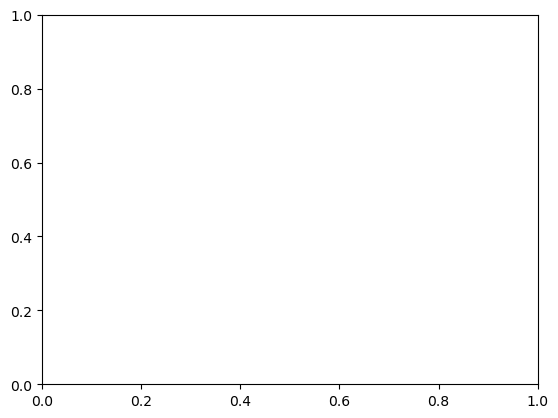

In [3]:
n = 100 # number of nodes
k = 5 # number of neighbors of each node

g = nx.Graph()
for i in range(n):
    for j in range(1, k//2 + 1):
        g.add_edge(i, (i + j) % n)
        g.add_edge(i, (i - j) % n)
        
    g.pos = nx.spring_layout(g)
    g.count = 0
    
# Initial drawing
plt.cla()
fig, ax = plt.subplots(figsize=(8, 8))
plt.close()

# simulate
def animate(frame):
    global g
    ax.clear()
    g.count += 1
    if g.count % 20 == 0: # rewiring once in every 20 steps
        nds = list(g.nodes())
        i = random.choice(nds)
        if g.degree(i) > 0:
            g.remove_edge(i, random.choice(list(g.neighbors(i))))
            nds.remove(i)
            
            for j in list(g.neighbors(i)):
                nds.remove(j)
                
            g.add_edge(i, random.choice(nds))
            
    # simulation of node movement
    g.pos = nx.spring_layout(g, pos=g.pos, iterations=5)
    
    plt.cla()
    nx.draw(g, pos = g.pos, ax=ax, node_color='black', node_size=10)
    plt.close()

In [4]:
anim = animation.FuncAnimation(fig, animate, frames=500, interval=200)

In [5]:
anim